<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [1]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://www.kaggle.com/datasets/tommykamaz/faces-dataset-small?resource=download-directory) и  [здесь](https://drive.google.com/drive/folders/14H7LQWzd09SaM11oLfGtd455sWH2rmRW?usp=share_link)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [2]:
def get_dataloader(image_size, batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object 
    """
    # TODO: resize images, convert them to tensors and build dataloader
    train_ds = ImageFolder(DATA_DIR, transform=tt.Compose([
        #tt.Resize(image_size), #с заранее измененными данными это не нужно
        #tt.CenterCrop(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats)])
    )
    train_dl = DataLoader(train_ds, batch_size, shuffle=True, pin_memory=True)
    return train_dl

In [3]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)

cuda


In [4]:
image_size = 128
batch_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
#DATA_DIR = '/Users/dantesto/Documents/Jupiter Nootebooks/Deep Leaning MIPT course/GAN/data'
DATA_DIR = '/Users/dantesto/Documents/Jupiter Nootebooks/Deep Leaning MIPT course/GAN/modified_data'

train_dl = get_dataloader(image_size, batch_size)

In [5]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

Для начала сохраним преобразованные изображения в отдельную папку, чтобы при обучении dataloader не тратил ресурсы на преобразование изображений на каждой эпохе. Для этого я в get_dataloader задал shuffle=False.

In [6]:
def modify_and_save_data():
    MODIFIED_DATA_DIR = '/Users/dantesto/Documents/Jupiter Nootebooks/Deep Leaning MIPT course/GAN/modified_data/faces_dataset_small_128x128/'
    i = 0
    for images, x in train_dl:
        denormed_images = denorm(images)
        for dimg in denormed_images:
            fname = "{:05d}.png".format(i) #файлы будут иметь названия из 5 цифр с ведущими нулями
            save_image(dimg, MODIFIED_DATA_DIR + fname)
            i += 1 # здесь я по ошибке написал i += 2, поэтому у меня все файлы с чётными назваинями

In [7]:
#modify_and_save_data()

In [8]:
def show_images(images, nmax=64, to_cpu=False):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    if to_cpu:
        ax.imshow(make_grid(denorm(images.cpu().detach()[:nmax]), nrow=8).permute(1, 2, 0))
    else:
        ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

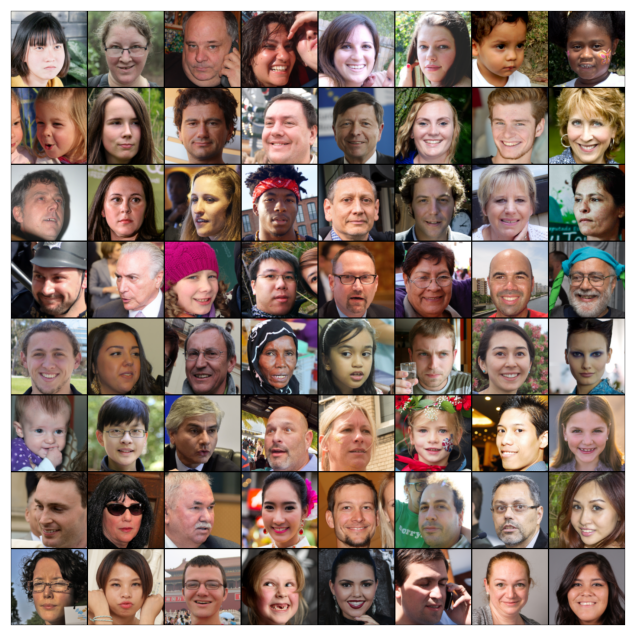

In [9]:
show_batch(train_dl)

In [10]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [11]:
train_dl = DeviceDataLoader(train_dl, DEVICE)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [12]:
dis_layers_size = [3, 64, 128, 256, 512, 1024, 1]
discriminator = nn.Sequential(
    #in: 3*128*128
    nn.Conv2d(dis_layers_size[0], dis_layers_size[1], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(dis_layers_size[1]),
    nn.ReLU(inplace=True),

    #in: 64*64*64
    nn.Conv2d(dis_layers_size[1], dis_layers_size[2], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(dis_layers_size[2]),
    nn.ReLU(inplace=True),

    #in: 128*32*32
    nn.Conv2d(dis_layers_size[2], dis_layers_size[3], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(dis_layers_size[3]),
    nn.ReLU(inplace=True),

    #in: 256*16*16
    nn.Conv2d(dis_layers_size[3], dis_layers_size[4], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(dis_layers_size[4]),
    nn.ReLU(inplace=True),

    #in: 512*8*8
    nn.Conv2d(dis_layers_size[4], dis_layers_size[5], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(dis_layers_size[5]),
    nn.ReLU(inplace=True),

    #in: 1024*4*4
    nn.Conv2d(dis_layers_size[5], dis_layers_size[6], kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1*1*1

    nn.Flatten(),
    nn.Sigmoid()
)
discriminator = to_device(discriminator, DEVICE)

In [13]:
"""
latent_size = 256
gen_layers_size = [latent_size, 1024, 512, 256, 128, 64, 3]
generator = nn.Sequential(
    #in: 256*1*1
    #nn.ConvTranspose2d(gen_layers_size[0], gen_layers_size[1], kernel_size=3, stride=2, padding=0, output_padding=1),
    nn.ConvTranspose2d(gen_layers_size[0], gen_layers_size[1], kernel_size=4, stride=1, padding=0),
    nn.BatchNorm2d(gen_layers_size[1]),
    nn.ReLU(inplace=True),

    #in: 1024*4*4
    #nn.ConvTranspose2d(gen_layers_size[1], gen_layers_size[2], kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.ConvTranspose2d(gen_layers_size[1], gen_layers_size[2], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(gen_layers_size[2]),
    nn.ReLU(inplace=True),

    #in: 512*8*8
    nn.ConvTranspose2d(gen_layers_size[2], gen_layers_size[3], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(gen_layers_size[3]),
    nn.ReLU(inplace=True),

    #in: 256*16*16
    nn.ConvTranspose2d(gen_layers_size[3], gen_layers_size[4], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(gen_layers_size[4]),
    nn.ReLU(inplace=True),

    #in: 128*32*32
    nn.ConvTranspose2d(gen_layers_size[4], gen_layers_size[5], kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(gen_layers_size[5]),
    nn.ReLU(inplace=True),

    #in: 64*64*64
    nn.ConvTranspose2d(gen_layers_size[5], gen_layers_size[6], kernel_size=4, stride=2, padding=1),
    # out: 3*128*128

    nn.Tanh()
)
generator = to_device(generator, DEVICE)
"""

'\nlatent_size = 256\ngen_layers_size = [latent_size, 1024, 512, 256, 128, 64, 3]\ngenerator = nn.Sequential(\n    #in: 256*1*1\n    #nn.ConvTranspose2d(gen_layers_size[0], gen_layers_size[1], kernel_size=3, stride=2, padding=0, output_padding=1),\n    nn.ConvTranspose2d(gen_layers_size[0], gen_layers_size[1], kernel_size=4, stride=1, padding=0),\n    nn.BatchNorm2d(gen_layers_size[1]),\n    nn.ReLU(inplace=True),\n\n    #in: 1024*4*4\n    #nn.ConvTranspose2d(gen_layers_size[1], gen_layers_size[2], kernel_size=3, stride=2, padding=1, output_padding=1),\n    nn.ConvTranspose2d(gen_layers_size[1], gen_layers_size[2], kernel_size=4, stride=2, padding=1),\n    nn.BatchNorm2d(gen_layers_size[2]),\n    nn.ReLU(inplace=True),\n\n    #in: 512*8*8\n    nn.ConvTranspose2d(gen_layers_size[2], gen_layers_size[3], kernel_size=4, stride=2, padding=1),\n    nn.BatchNorm2d(gen_layers_size[3]),\n    nn.ReLU(inplace=True),\n\n    #in: 256*16*16\n    nn.ConvTranspose2d(gen_layers_size[3], gen_layers_size

In [14]:
latent_size = 100
gen_layers_size = [-1, 3, 64, 128, 256, 128, 64, 3]

def BasicBlockConv(in_size, out_size):
    bb = nn.Sequential(
        nn.Conv2d(in_size, out_size, kernel_size=4, stride=1, padding=2, bias=False),
        nn.Conv2d(out_size, out_size, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(out_size),
        nn.LeakyReLU(0.3)
    )
    return bb

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(latent_size, 3*image_size*image_size, bias=False)
        self.basic_conv1 = BasicBlockConv(gen_layers_size[1], gen_layers_size[2])
        self.basic_conv2 = BasicBlockConv(gen_layers_size[2], gen_layers_size[3])
        self.conv_tr = nn.ConvTranspose2d(gen_layers_size[3], gen_layers_size[4], kernel_size=5, stride=1, padding=2, bias=False)
        self.conv = nn.Conv2d(gen_layers_size[4], gen_layers_size[4], kernel_size=4, stride=2, padding=1, bias=False)
        self.act = nn.LeakyReLU(0.3)
        self.ups1 = nn.Sequential(
            nn.ConvTranspose2d(gen_layers_size[4], gen_layers_size[4], kernel_size=5, stride=1, padding=2, bias=False),
            nn.ConvTranspose2d(gen_layers_size[4], gen_layers_size[4], kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gen_layers_size[4]),
            nn.LeakyReLU(0.3)
        )
        self.ups2 = nn.Sequential(
            nn.ConvTranspose2d(gen_layers_size[4], gen_layers_size[5], kernel_size=5, stride=1, padding=2, bias=False),
            nn.ConvTranspose2d(gen_layers_size[5], gen_layers_size[5], kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gen_layers_size[5])
        )
        self.ups3 = nn.Sequential(
            nn.ConvTranspose2d(gen_layers_size[5], gen_layers_size[6], kernel_size=4, stride=2, padding=1, bias=False),
            nn.ConvTranspose2d(gen_layers_size[6], gen_layers_size[6], kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(gen_layers_size[6]),
        )
        self.last = nn.ConvTranspose2d(gen_layers_size[6], gen_layers_size[7], kernel_size=5, stride=1, padding=2, bias=False)
        self.fin_act = nn.Tanh()

    def forward(self, x):
        #latent_sizex1x1
        x = nn.Flatten()(x) #latent_size
        x = self.fc(x) #128*128*3
        x = x.view(-1, 3, 128, 128) #3x128x128
        x = self.basic_conv1(x) #128x64x64
        x = self.basic_conv2(x) #256x32x32
        x = self.conv_tr(x) #512x32x32
        x = self.conv(x) #512x16x16
        x = self.act(x) #512x16x16
        x = self.ups1(x) #512x32x32
        x = self.ups2(x) #256x64x64
        x = self.ups3(x) #128x128
        x = self.last(x) #3x128x128
        x = self.fin_act(x) #3x128x128
        return x

generator = to_device(Generator(), DEVICE)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [16]:
lr = 0.0001
#del model
model = {
    "discriminator": discriminator,
    "generator": generator
}
criterion = {
    "discriminator": nn.BCELoss(), #nn.MSELoss(),  #nn.BCELoss(), #- заменяю на MSE по трюкам из лекции
    "generator": nn.BCELoss() #nn.MSELoss() #nn.BCELoss()
}
max_epochs = 41

In [17]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=DEVICE)

In [18]:
from collections import deque

class GeneratorBuffer:
    def __init__(self, generator, batch_size, fill=True, max_size=64): #лектор говорил о размере буфера ~1000. Тут из-за размера буфера 1к+ генератор сразу переучивается и выдаёт шум
        self.generator = generator #хотелось бы знать конечно как гуглить эту фишку с буфером, потому что не нашел ничего, а лектор и не сказал как это называется
        self.buffer = deque()
        self.batch_size = batch_size
        if fill:
            self.fill_buffer(max_size)

    def buff_size(self):
        return len(self.buffer) * self.batch_size

    def fill_buffer(self, max_size=1000):
        while self.buff_size() < max_size:
            self.append_batch()

    def append_batch(self):
        with torch.no_grad():
            #self.generator.eval()
            latent = torch.randn(self.batch_size, latent_size, 1, 1, device=DEVICE)
            self.buffer.append(self.generator(latent))
            #self.generator.train()

    def get_batch(self):
        return self.buffer.popleft()

In [19]:
def fit(model, criterion, epochs, lr, lr_norm=0.0001):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    gen_buffer = GeneratorBuffer(model["generator"], batch_size, max_size=batch_size) #буфер с выходами генератора по трюкам из видео
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=DEVICE) - torch.rand(real_images.size(0), 1, device=DEVICE) * 0.05 #зашумляем метки по трюкам из лекции
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            #latent = torch.randn(batch_size, latent_size, 1, 1, device=DEVICE)
            #fake_images = model["generator"](latent)
            gen_buffer.append_batch() #создаем новые изображения и добавляем в конец очереди
            fake_images = gen_buffer.get_batch() #а возваращем старые из начала очереди

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=DEVICE) + torch.rand(fake_images.size(0), 1, device=DEVICE) * 0.05
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss + lr_norm * sum(p.norm(2) for p in model["discriminator"].parameters()) #добавили регуляризацию
            #optimizer["discriminator"].zero_grad()
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=DEVICE) #так как здесь обучаем генератор, использовоать будем новые генерации,
            fake_images = model["generator"](latent) #а не старые, как в случае с дискриминатором
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=DEVICE) - torch.rand(batch_size, 1, device=DEVICE) * 0.05
            loss_g = criterion["generator"](preds, targets) + lr_norm * sum(p.norm(2) for p in model["generator"].parameters())
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        if epoch % 5 == 0:
            show_images(model["generator"](fixed_latent), to_cpu=True)
            
    return losses_g, losses_d, real_scores, fake_scores

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/41], loss_g: 3.0234, loss_d: 0.5857, real_score: 0.8500, fake_score: 0.1639


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [2/41], loss_g: 3.0752, loss_d: 0.7187, real_score: 0.8306, fake_score: 0.1716


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [3/41], loss_g: 2.5791, loss_d: 0.5502, real_score: 0.8383, fake_score: 0.1567


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [4/41], loss_g: 3.5762, loss_d: 0.5119, real_score: 0.8803, fake_score: 0.1304


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [5/41], loss_g: 3.2086, loss_d: 0.5322, real_score: 0.8597, fake_score: 0.1270


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [6/41], loss_g: 3.5064, loss_d: 0.5163, real_score: 0.8776, fake_score: 0.1192


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [7/41], loss_g: 3.3895, loss_d: 0.4677, real_score: 0.8973, fake_score: 0.1030


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [8/41], loss_g: 3.2949, loss_d: 0.4446, real_score: 0.8909, fake_score: 0.1108


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [9/41], loss_g: 3.3027, loss_d: 0.4583, real_score: 0.8937, fake_score: 0.1063


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [10/41], loss_g: 3.6963, loss_d: 0.4483, real_score: 0.8957, fake_score: 0.0987


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [11/41], loss_g: 3.7687, loss_d: 0.4610, real_score: 0.8914, fake_score: 0.1026


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [12/41], loss_g: 3.5071, loss_d: 0.3821, real_score: 0.9182, fake_score: 0.0860


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [13/41], loss_g: 3.5094, loss_d: 0.4029, real_score: 0.9126, fake_score: 0.0836


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [14/41], loss_g: 3.9377, loss_d: 0.4611, real_score: 0.8964, fake_score: 0.0975


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [15/41], loss_g: 3.9708, loss_d: 0.4860, real_score: 0.8962, fake_score: 0.1059


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [16/41], loss_g: 3.5876, loss_d: 0.4174, real_score: 0.9060, fake_score: 0.0898


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [17/41], loss_g: 4.4058, loss_d: 0.4517, real_score: 0.9111, fake_score: 0.0865


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [18/41], loss_g: 4.3714, loss_d: 0.5387, real_score: 0.8898, fake_score: 0.1084


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [19/41], loss_g: 4.1311, loss_d: 0.4407, real_score: 0.9101, fake_score: 0.0893


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [20/41], loss_g: 3.5143, loss_d: 0.2930, real_score: 0.9585, fake_score: 0.0455


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [21/41], loss_g: 4.2748, loss_d: 0.4874, real_score: 0.8920, fake_score: 0.1041


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [22/41], loss_g: 3.7150, loss_d: 0.4050, real_score: 0.9150, fake_score: 0.0881


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [23/41], loss_g: 3.9584, loss_d: 0.4270, real_score: 0.9091, fake_score: 0.0914


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [24/41], loss_g: 3.9650, loss_d: 0.4711, real_score: 0.9017, fake_score: 0.0888


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [25/41], loss_g: 4.0207, loss_d: 0.4607, real_score: 0.9038, fake_score: 0.0919


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [26/41], loss_g: 4.1410, loss_d: 0.3370, real_score: 0.9524, fake_score: 0.0559


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [27/41], loss_g: 4.0234, loss_d: 0.4612, real_score: 0.9220, fake_score: 0.0783


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [28/41], loss_g: 3.7767, loss_d: 0.4186, real_score: 0.9090, fake_score: 0.0890


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [29/41], loss_g: 3.6939, loss_d: 0.3874, real_score: 0.9162, fake_score: 0.0835


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [30/41], loss_g: 3.4508, loss_d: 0.3790, real_score: 0.9141, fake_score: 0.0763


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [31/41], loss_g: 4.3279, loss_d: 0.3722, real_score: 0.9403, fake_score: 0.0651


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [32/41], loss_g: 4.0585, loss_d: 0.3979, real_score: 0.9203, fake_score: 0.0740


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [33/41], loss_g: 4.5689, loss_d: 0.4369, real_score: 0.9149, fake_score: 0.0873


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [34/41], loss_g: 3.9597, loss_d: 0.3929, real_score: 0.9222, fake_score: 0.0756


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [35/41], loss_g: 3.7176, loss_d: 0.3905, real_score: 0.9213, fake_score: 0.0813


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [36/41], loss_g: 3.8851, loss_d: 0.4123, real_score: 0.9146, fake_score: 0.0706


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [37/41], loss_g: 4.3926, loss_d: 0.4437, real_score: 0.9353, fake_score: 0.0783


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [38/41], loss_g: 3.9740, loss_d: 0.3489, real_score: 0.9346, fake_score: 0.0646


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [39/41], loss_g: 3.8388, loss_d: 0.3749, real_score: 0.9298, fake_score: 0.0704


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [40/41], loss_g: 3.8315, loss_d: 0.3850, real_score: 0.9300, fake_score: 0.0719


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [41/41], loss_g: 3.8114, loss_d: 0.2915, real_score: 0.9566, fake_score: 0.0396


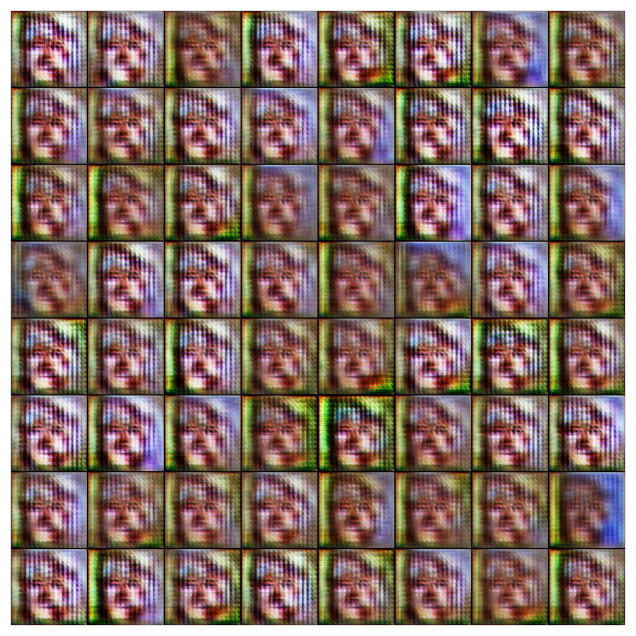

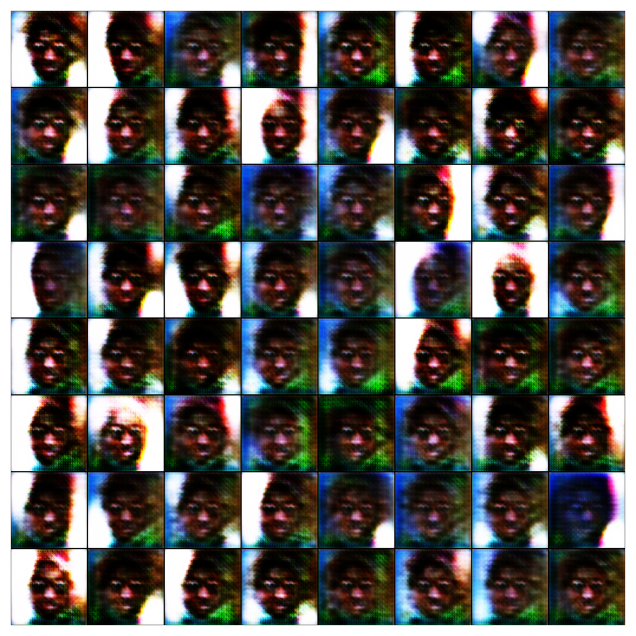

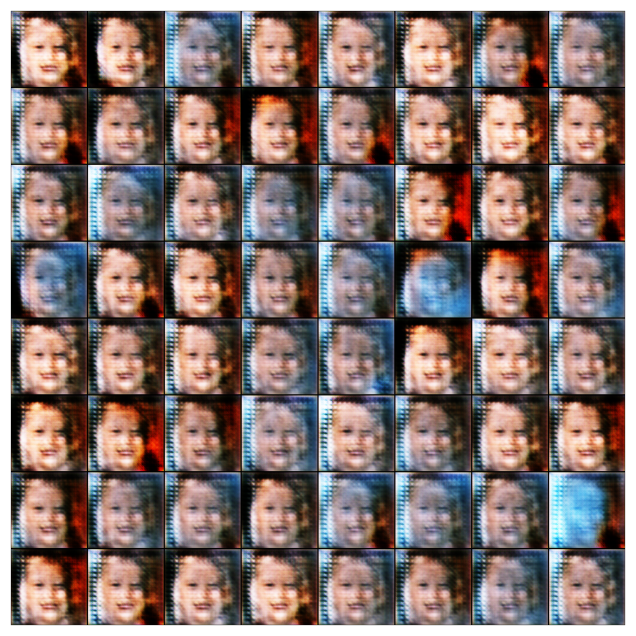

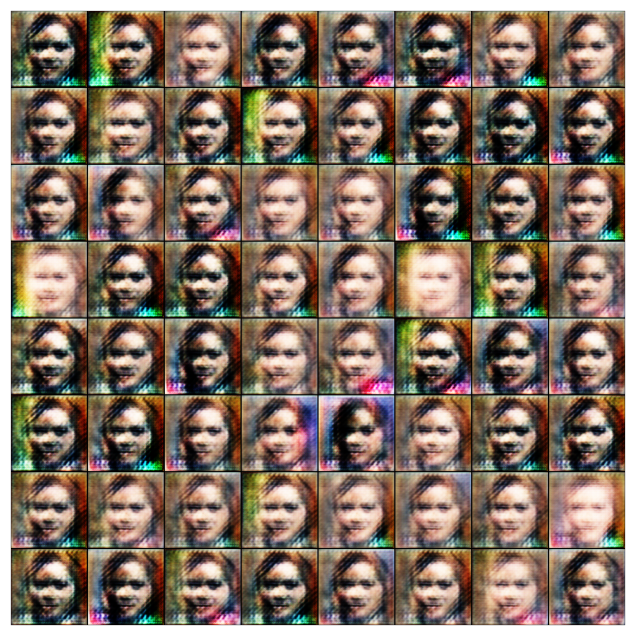

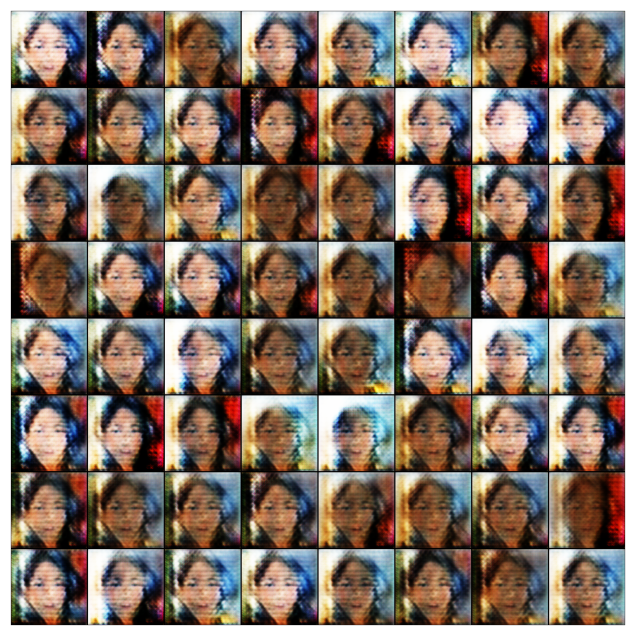

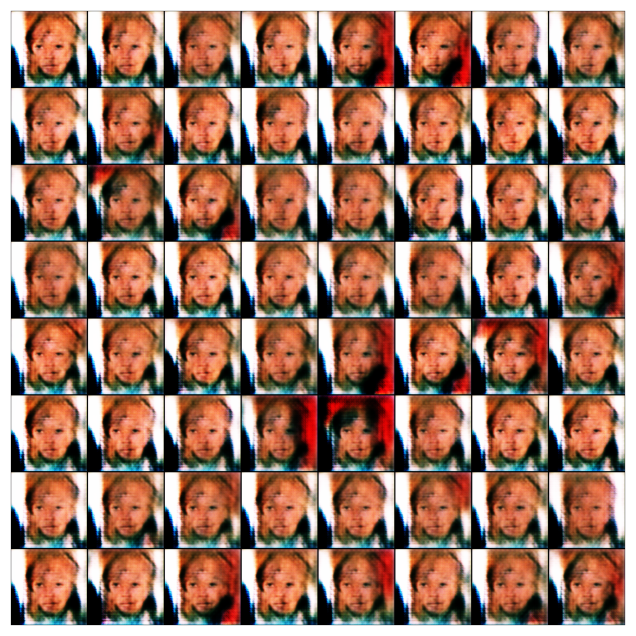

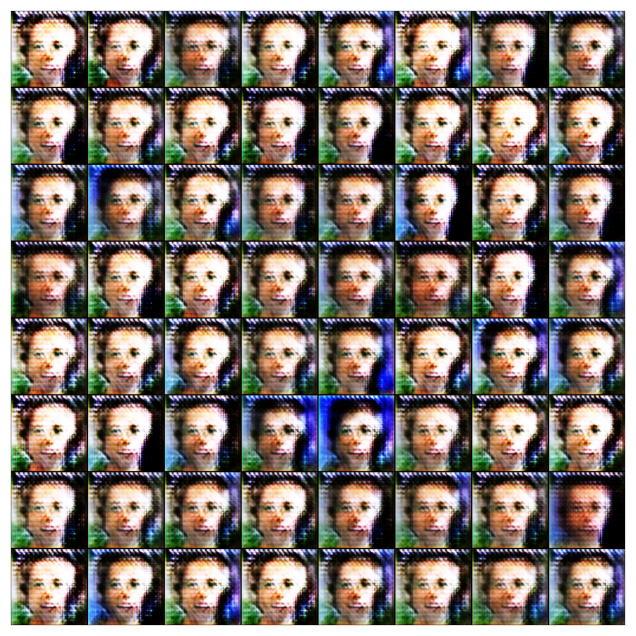

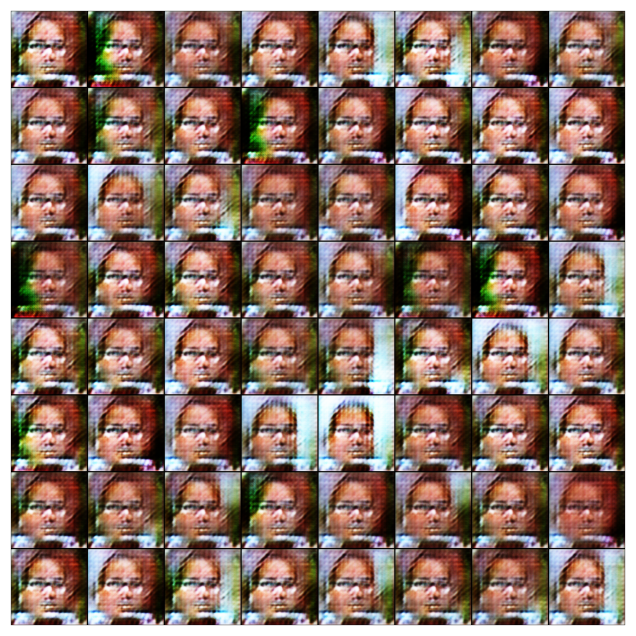

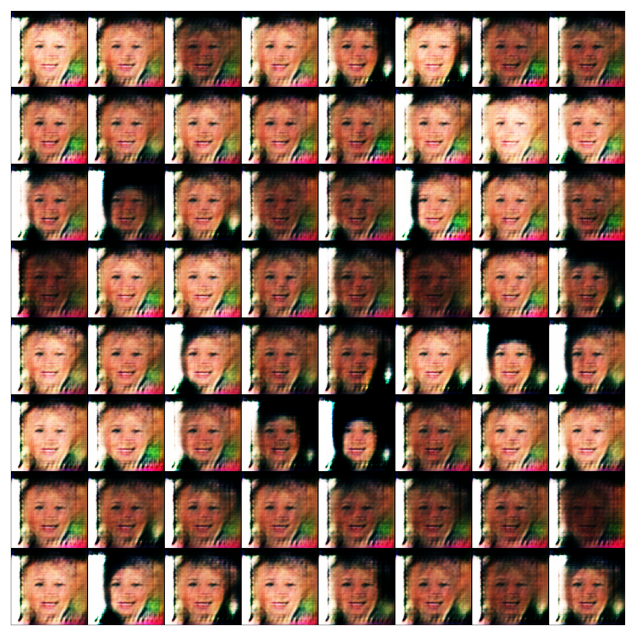

In [26]:
history = fit(model, criterion, max_epochs, lr)

In [27]:
torch.save(model["discriminator"].state_dict(), 'gan_conv_dis1.pth')
torch.save(model["generator"].state_dict(), 'gan_segnet_gen1.pth')

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

In [22]:
losses_g, losses_d, real_scores, fake_scores = history

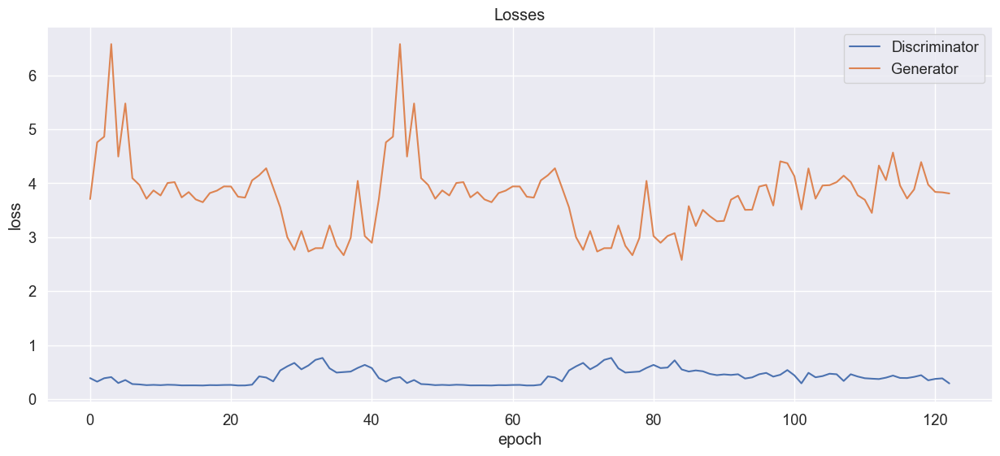

In [38]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

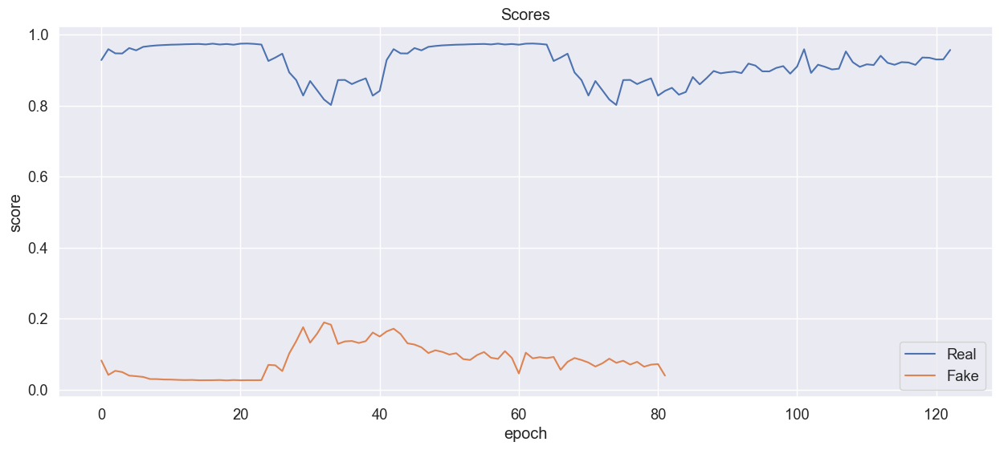

In [39]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

Здесь часть графика fake отсутсвует, потому что я запускал обучение сети два раза и с ошибкой дописал новые значения в конец переменной fake_scores. Он дальше сходится к верному значению ~0.025. У меня и вывод ячейки с обучением - это второе обучение.

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

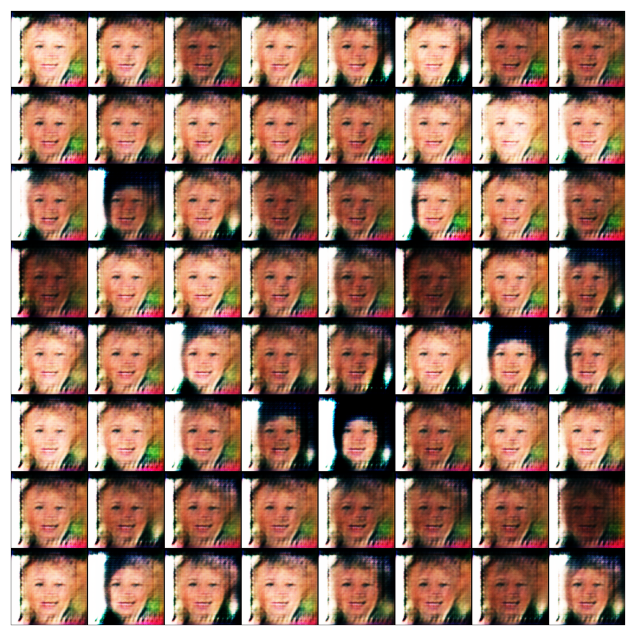

In [40]:
model["generator"].eval()
fake_images = model["generator"](fixed_latent)
show_images(fake_images, to_cpu=True)

Как вам качество получившихся изображений?

Говно, все одинаковые. Я в последний момент успел разобраться почему моя сеть не обучалась, так что успел получить только такой результат. Как исправить одинаковость я не понимаю.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [41]:
import math

model["generator"].eval()
fake_images = []
for i in range(len(train_dl)):
    with torch.no_grad():
        latent = torch.randn(batch_size, latent_size, 1, 1, device=DEVICE)
        fake_images.append(model["generator"](latent))
fake_images = torch.cat(fake_images, dim=0)
fake_images = fake_images.view(fake_images.size()[0], -1)
real_images = []
for batch, _ in train_dl:
    real_images.append(batch)
real_images = torch.cat(real_images, dim=0)
real_images = real_images.view(real_images.size()[0], -1)
all_images = torch.cat([fake_images, real_images], dim=0).cpu().numpy()
targets = np.concatenate((np.zeros(len(fake_images)), np.ones(len(real_images))))

Чтобы не ждать предсказания для всех проверок, сделаем их только для 200 разбиений из ~6000 разбиений. С помощью предлагаемого заданием способа проверка всех разбиений займёт O(len(all_images) x len(all_images) x n x m x c), где n и m - размер картинки, а c - количетство каналов. Ведь для каждого разбиения (таких будет для Leave one out len(all_images)) нужно найти расстояние до ближайшего соседа. Соседей у него len(all_images) - 1, а для подсчета расстояния придется посчитать метрику для всех фичей (их n x m x c).

Я не буду использовать сплиты LeaveOneOut из sklearn в том порядке, в котором он их выдаёт, так как он мне даст разбиения в том порядке, в котором у меня лежат изображения, а они лежат именно так, что первыми идут только фейковые изображения.

In [42]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut

pred_targets = []
real_targets = []
loo = LeaveOneOut()
i = 0
for train, test in loo.split(all_images, targets):
    if i < 100 or i > len(all_images) - 101:
        knn = KNeighborsClassifier(1)
        knn.fit(all_images[train], targets[train])
        pred_targets.append(knn.predict(all_images[test])[0])
        real_targets.append(targets[test][0])
    i += 1

Конечно можно было сначала превратить все изображения из тензоров 3x128x128 в 2D точки с помощью TSNE, чтобы и knn считал расстояния в двумерном пространстве фичей, а не 3x128x128, и потом еще отобразить точки на графике было бы легко. Но мне не захотелось.

In [43]:
print(len(pred_targets))

200


In [44]:
pred_targets = np.array(pred_targets)
real_targets = np.array(real_targets)
print("Accuracy:", (pred_targets == real_targets).mean())

Accuracy: 1.0


Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

Результат говно, потому что он значит, что генератор даже близко не похож на то, что ему давали на вход. А хотелось бы иметь точность 0.5, чтобы настоящие изображения предсказывались как настоящие (таргет 1), и фейковые тоже. Это в какой-то момент дискрименатор успел научиться определять фейки от генератора, видно по графикам выше.

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [45]:
from sklearn.manifold import TSNE

fake_images_2d = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3).fit_transform(fake_images.cpu().numpy())
real_images_2d = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3).fit_transform(real_images.cpu().numpy())

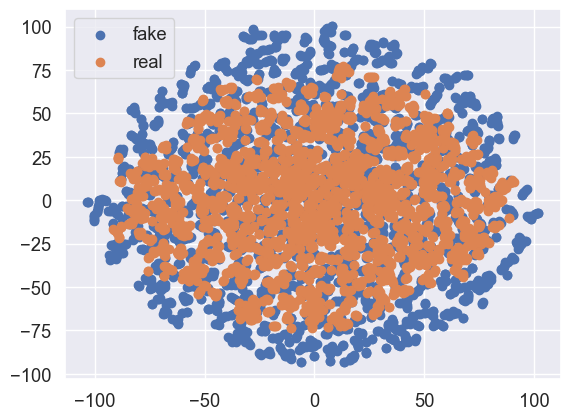

In [46]:
f_sc = plt.scatter(fake_images_2d[:, 0], fake_images_2d[:, 1])
r_sc = plt.scatter(real_images_2d[:, 0], real_images_2d[:, 1])
plt.legend((f_sc, r_sc), ("fake", "real"))
plt.show()

Прокомментируйте получившийся результат:

Бред какой-то. По графику кажется, что реальные от фейковых не отличить, но это же совсем не так.